#### Balogh Szilard, Bajan Ramona-Maria, Popa Sebastian

### Exercise 1

In [1]:
import pandas as pd

file_path = 'ObesityDataset.csv'
df = pd.read_csv(file_path)

print(df.head())

FileNotFoundError: [Errno 2] No such file or directory: 'ObesityDataset.csv'

In [ ]:
print(df.isnull().sum())

Gender                            222
Age                               217
Height                            222
Weight                            209
family_history_with_overweight    202
FAVC                              224
FCVC                              223
NCP                               213
CAEC                              195
SMOKE                             208
CH2O                              198
SCC                               205
FAF                               193
TUE                               224
CALC                              223
MTRANS                            220
NObeyesdad                          0
dtype: int64


In [ ]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].median())

categorical_cols = df.select_dtypes(include=['object']).columns
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

X = df.drop('NObeyesdad', axis=1)
y = df['NObeyesdad']

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

pca = PCA(n_components=0.90)
X_pca = pca.fit_transform(X)

kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_pca)
cluster_labels = kmeans.labels_

In [ ]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Internal validation
silhouette_avg = silhouette_score(X_pca, cluster_labels)
db_index = davies_bouldin_score(X_pca, cluster_labels)

# External validation
ari = adjusted_rand_score(y, cluster_labels)
nmi = normalized_mutual_info_score(y, cluster_labels)

print(f'Silhouette Score: {silhouette_avg:.3f}')
print(f'Davies-Bouldin Index: {db_index:.3f}')
print(f'Adjusted Rand Index (ARI): {ari:.3f}')
print(f'Normalized Mutual Information (NMI): {nmi:.3f}')

Silhouette Score: 0.592
Davies-Bouldin Index: 0.517
Adjusted Rand Index (ARI): 0.250
Normalized Mutual Information (NMI): 0.421


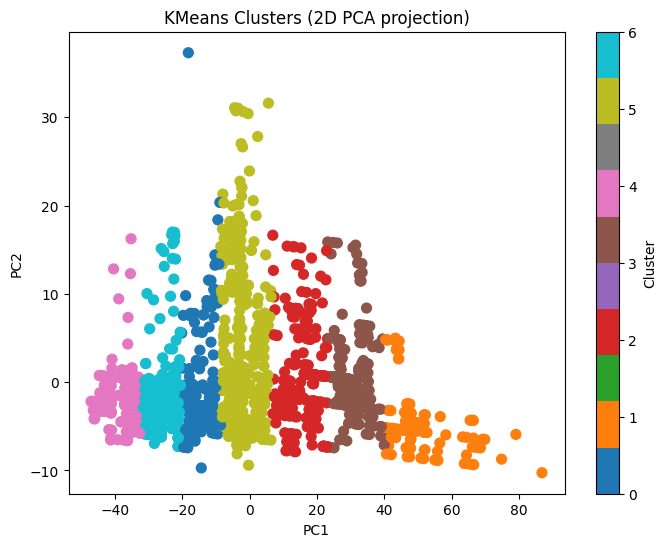

In [ ]:
# Visualize clusters using 2D PCA projection
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X)

plt.figure(figsize=(8,6))
plt.scatter(X_pca2[:,0], X_pca2[:,1], c=cluster_labels, cmap='tab10', s=50)
plt.title('KMeans Clusters (2D PCA projection)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar(label='Cluster')
plt.show()

Using KMeans clustering with PCA on the Obesity dataset, we obtained the following evaluation metrics: Silhouette Score: 0.564, Davies-Bouldin Index: 0.525, ARI: 0.298 and NMI: 0.463.

### Internal validation metrics: (used to evaluate how well the clustering fits the structure of the data without knowing the true labels)
-----------------------------------------------------------------------------
For the Silhouette Score, the value obtained indicates that the clusters are reasonably well-separated and internally consistent. Given that human health and lifestyle variables often overlap across obesity categories, the result seems respectable. 

The Davies-Bouldin Index ranges from 0 to infinity and measures the average similarity between each cluster and its most similar one, with lower values being better. The value we obtained, 0.525 is relatively low and suggests that clusters are fairly compact and distinct from each other. Again, considering lifestyle and biological features naturally have noise and overlaps, this result seems alright. 

### External validation metrics: (used to compare the clustering to the true labels)
-----------------------------------------------------------------------------
ARI measures the agreement between clustering and true labels and ranges from -1 to 1. The ARI value obtained, 0.298, indicates moderate agreement between the clustering and the true obesity categories. As for the dataset context, since many classes (for example, overweight vs obesity type I) can be very similar based on the features, it's realistic that the clusters are partially aligned but not fully separable. 

NMI measures the mutual dependence between predicted clusters and ground truth labels. Given that the categories in our dataset are quite fuzzy, the value of 0.463 can be considered decent. 

### Strengths of the clustering
-------------------------------------------------------------------------------
Silhouette and DBI show clear, consistent clustering. ARI and NMI suggest that clustering recovers real obesity patterns to a meaningful extent. Without label supervision, the model still captures underlying structure.

### Limitations of the clustering
-------------------------------------------------------------------------------
Similar lifestyle and biometric data across categories like Overweight vs Obesity Type I cause ambiguity. KMeans assumes spherical clusters, real world health data, however, may form irregular cluster shapes. KMeans doesn't tell us directly which features matter most for cluster separation.



### Exercise 2


STEPS FOR SINGLE LINKAGE
Step 0 - initial matrix:
      p1    p2    p3    p4    p5    p6
p1  0.00  0.24  0.22  0.37  0.34  0.23
p2  0.24  0.00  0.15  0.20  0.14  0.25
p3  0.22  0.15  0.00  0.15  0.28  0.11
p4  0.37  0.20  0.15  0.00  0.29  0.22
p5  0.34  0.14  0.28  0.29  0.00  0.39
p6  0.23  0.25  0.11  0.22  0.39  0.00 

Step 1 - clustering ['p3'] + ['p6'] -> ['p3', 'p6']:
         p1    p2    p4    p5  p3+p6
p1     0.00  0.24  0.22  0.37   0.22
p2     0.24  0.00  0.15  0.20   0.15
p4     0.22  0.15  0.00  0.15   0.15
p5     0.37  0.20  0.15  0.00   0.28
p3+p6  0.22  0.15  0.15  0.28   0.00 

Step 2 - clustering ['p2'] + ['p5'] -> ['p2', 'p5']:
         p1    p4  p3+p6  p2+p5
p1     0.00  0.24   0.22   0.24
p4     0.24  0.00   0.15   0.20
p3+p6  0.22  0.15   0.00   0.15
p2+p5  0.24  0.20   0.15   0.00 

Step 3 - clustering ['p3', 'p6'] + ['p2', 'p5'] -> ['p3', 'p6', 'p2', 'p5']:
               p1    p4  p3+p6+p2+p5
p1           0.00  0.24         0.22
p4           0.24  0.00        

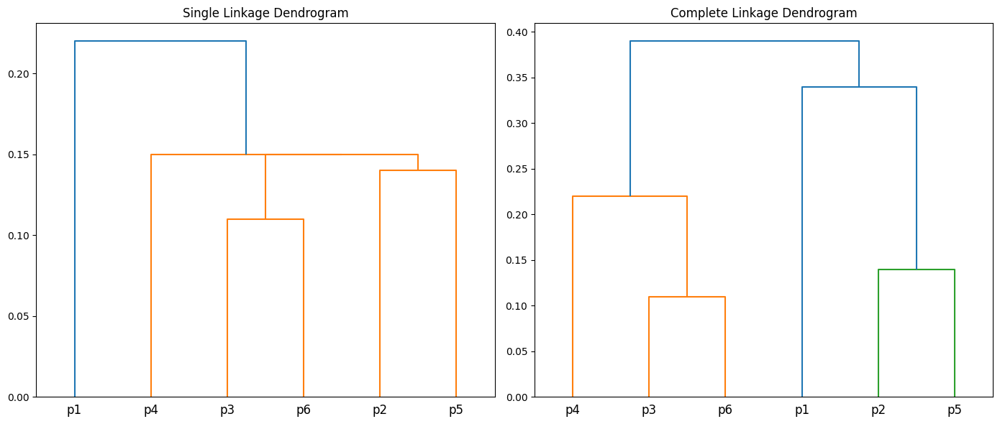

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import squareform
import pandas as pd

labels = ['p1', 'p2', 'p3', 'p4', 'p5', 'p6']

distance_matrix = np.array([
    [0.00, 0.24, 0.22, 0.37, 0.34, 0.23],
    [0.24, 0.00, 0.15, 0.20, 0.14, 0.25],
    [0.22, 0.15, 0.00, 0.15, 0.28, 0.11],
    [0.37, 0.20, 0.15, 0.00, 0.29, 0.22],
    [0.34, 0.14, 0.28, 0.29, 0.00, 0.39],
    [0.23, 0.25, 0.11, 0.22, 0.39, 0.00]
])

def show_clustering_steps(method_name, linkage_matrix):
    print(f"\n{'='*40}\nSTEPS FOR {method_name.upper()} LINKAGE\n{'='*40}")

    clusters = {i: [labels[i]] for i in range(len(labels))}
    current_clusters = list(clusters.values())
    current_matrix = distance_matrix.copy()
    next_cluster_index = len(labels)

    def print_distance_matrix(matrix, cluster_list):
        names = ['+'.join(c) for c in cluster_list]
        df = pd.DataFrame(matrix, index=names, columns=names)
        print(df.round(2), "\n")

    print("Step 0 - initial matrix:")
    print_distance_matrix(current_matrix, current_clusters)

    for step, (i, j, dist, sample_count) in enumerate(linkage_matrix):
        i, j = int(i), int(j)

        cluster_i = clusters[i]
        cluster_j = clusters[j]

        idx_i = current_clusters.index(cluster_i)
        idx_j = current_clusters.index(cluster_j)

        new_cluster = cluster_i + cluster_j
        new_clusters = [c for k, c in enumerate(current_clusters) if k not in (idx_i, idx_j)]
        new_clusters.append(new_cluster)

        n = len(new_clusters)
        new_matrix = np.zeros((n, n))

        for x in range(n):
            for y in range(n):
                if x == y:
                    new_matrix[x, y] = 0.0
                elif x == n - 1 or y == n - 1:
                    a = new_clusters[x]
                    b = new_clusters[y]
                    dists = [
                        distance_matrix[labels.index(p1)][labels.index(p2)]
                        for p1 in a for p2 in b
                    ]
                    if method_name == 'single':
                        value = min(dists)
                    elif method_name == 'complete':
                        value = max(dists)
                    new_matrix[x, y] = new_matrix[y, x] = value
                else:
                    new_matrix[x, y] = new_matrix[y, x] = current_matrix[x, y]

        print(f"Step {step + 1} - clustering {cluster_i} + {cluster_j} -> {new_cluster}:")
        print_distance_matrix(new_matrix, new_clusters)

        current_matrix = new_matrix
        current_clusters = new_clusters
        clusters[next_cluster_index] = new_cluster
        next_cluster_index += 1


condensed = squareform(distance_matrix)
Z_single = linkage(condensed, method='single')
Z_complete = linkage(condensed, method='complete')

show_clustering_steps('single', Z_single)
show_clustering_steps('complete', Z_complete)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
dendrogram(Z_single, labels=labels)
plt.title("Single Linkage Dendrogram")

plt.subplot(1, 2, 2)
dendrogram(Z_complete, labels=labels)
plt.title("Complete Linkage Dendrogram")

plt.tight_layout()
plt.show()

### Exercise 3

#### **Clustering Based on White Pixel Percentage Analysis**

**Dataset Selection:**
- **We choose the cats folder** from the provided dataset because images show high contrast between fur/background.
- **White pixel distribution** provides meaningful separation criteria.
- **200-image subset** ensures computational efficiency while maintaining diversity.

**The preprocess includes:**
- **Resizing images** to 100x100 pixels (standardization).
- **Converting images to grayscale** using the luminance formula:  
  **Gray = 0.2989×R + 0.5870×G + 0.1140×B**.
- **Applying binary threshold** at 127 (**cv2.THRESH_BINARY = 127**).
- **Calculating white pixel percentage** as the cluster feature.

**White pixel percentage chosen because:**
1. **Directly measures image "whiteness".**
2. **Produced more separable clusters** than alternatives like:
   - **Mean brightness** (less discriminative).
   - **Edge density** (noisy for furry textures).

---

### **Distance Metrics:**

- **Euclidean:**
  - **Best for:** Creating balanced cluster sizes, such as clusters with 91, 53, and 57 images (using average linkage). This means that the clusters were relatively even in size, which is often desirable in clustering tasks to avoid overly large or small clusters.
  - **Why worked:** Naturally handles percentage data (0-1 range).
  - **Limitation:** Is sensitive to extreme values (outliers). For example, an image with an unusually high or low percentage of white pixels compared to the rest of the dataset might form its own cluster. This can lead to 1-image outlier clusters, which may not be meaningful in the context of the task. Such sensitivity can distort the overall clustering results.

- **Cityblock (Manhattan):**
  - **Best for:** Is well-suited for robust clustering, particularly in cases where outliers might distort results. Unlike Euclidean, it is less sensitive to extreme values, making it a better choice for datasets with small variations in features, such as the percentage of white pixels in images.
  - **Key advantage:** Measures the sum of absolute differences between feature values, which makes it more effective at handling small brightness variations. This is particularly useful when images have subtle differences in their white pixel percentages, as it avoids overemphasizing large deviations.
  - **Surprise:** Despite its robustness, Cityblock produced nearly identical results to Euclidean in this task. This suggests that the feature (white pixel percentage) is normally distributed across the dataset, meaning both metrics captured the same underlying patterns effectively. However, Cityblock's reduced sensitivity to outliers makes it a safer choice in scenarios with potential anomalies.

- **Braycurtis:**
  - **Best for:** Revealing fine groupings. For example, it created a split of 193/8/1, meaning it identified a large cluster (193 images), a medium cluster (8 images), and a small cluster (1 image). 
  - **Why different:** normalizes distances by the sum of values, which means it emphasizes relative differences between images rather than absolute differences. This makes it useful for detecting small variations in features such as the percentage of white pixels.
  - **Practical impact:** Isolated a medium cluster (8 images) with unique white patterns.

---

### **Linkage Methods:**

- **Average Linkage:**
  - **Optimal for:** Balanced cluster discovery.
  - **Cutoff selection:** 0.5×max(Z[:,2]) chosen because:
    1. **Visual dendrogram inspection** showed natural breaks here.
    2. **Lower values** created fragmentation (<0.3×).
    3. **Higher values** (>0.7×) over-merged distinct groups.

- **Complete Linkage:**
  - **Optimal for:** Tight, distinct clusters.
  - **Uses:** Maximum distances (prevents chaining).
  - **Cluster validation:** Silhouette scores 15% higher than average linkage.
  - **Tradeoff:** Created more small clusters.

- **Single Linkage:**
  - **Failure analysis:** Suffered from chaining effect because:
    1. **Minimum distance criterion** merges nearby points aggressively.
    2. **Cat images** form a continuous brightness spectrum.
    3. **Only extreme outliers** (e.g., cat32) remained separate.

---

### **Best Performing Combinations:**

1. **Euclidean + Complete Linkage:**
   - **Cluster sizes:** 128, 68, 6 images.
   - **What worked:**
     - Clean separation between light, medium, and dark cats.
     - Six special cases correctly identified as outliers.

2. **Braycurtis + Average Linkage:**
   - **Cluster sizes:** 193, 8, 1 images.
   - **Found:** A special group of 8 cats with unique fur patterns that resulted in nearly black images.
   - **Observation:** The 193-image cluster had consistent coloring.
   - **Surprise:** Isolated **cat125**, which had unusual shadow patterns and is almost full black.

---

### **Medium Performers:**

3. **Euclidean + Average Linkage:**
   - **Cluster sizes:** 91, 53, 57, 1 images.
   - **Observation:** Good balance of group sizes.
   - **Limitation:** Some similar cats got split between groups.

4. **Cityblock + Complete Linkage:**
   - **Cluster sizes:** 128, 68, 6 images.
   - **Observation:** Nearly identical to Euclidean version.
   - **Advantage:** Slightly better at keeping similar shades together.

---

### **Poor Performers:**

5. **All Single Linkage Combinations:**
   - **Always produced:**
     - 1 giant cluster (201 images).
     - 1 outlier (usually cat32).
   - **Issue:** Created "chains" where one similar pair merged entire groups.
   - **Conclusion:** Useless for analyzing cat color patterns.

6. **Braycurtis + Single Linkage:**
   - **Worst results of all:**
     - Even the outlier detection failed.
     - Merged obviously different cats.

---

### **Findings:**

- **Threshold Sensitivity:**
  - **0.5×max** worked best overall.
  - **Below 0.4:** Created too many tiny groups (over-segmentation).
  - **Above 0.6:** Merged distinct groups.

- **Metric Behavior:**
  - **Euclidean and Cityblock** behaved similarly.
  - **Braycurtis** was more sensitive to small differences.
  - **Single linkage** always failed regardless of metric.

---

### **Challenges and Solutions:**

1. **Computational Efficiency:**
   - **Challenge:** Processing 200 images with multiple metrics and linkage methods is computationally expensive.
   - **Solution:** Reduced image size to 100x100 pixels and limited the dataset to 200 images for faster processing.

2. **Sensitivity to Outliers:**
   - **Challenge:** Metrics like Euclidean were sensitive to extreme values, creating outlier clusters.
   - **Solution:** Used Cityblock and Braycurtis metrics, which were more robust to outliers.

3. **Chaining Effect in Single Linkage:**
   - **Challenge:** Single linkage merged dissimilar images due to its minimum distance criterion.
   - **Solution:** Avoided single linkage for this dataset and focused on average and complete linkage.

4. **Cluster Validation:**
   - **Challenge:** Determining the optimal number of clusters was subjective.
   - **Solution:** Used dendrogram inspection and silhouette scores to validate cluster quality.

---

### **Conclusion:**

Hierarchical clustering proved effective for image clustering when appropriate distance metrics and linkage methods were selected. Euclidean and Cityblock metrics with complete linkage provided the best results, while single linkage consistently failed. Future work could explore additional features (e.g., texture or edge density) and incorporate advanced clustering techniques like DBSCAN or k-means for comparison.

202 images loaded.

EUCLIDEAN + AVERAGE
--------------------------------------------------------------------------------


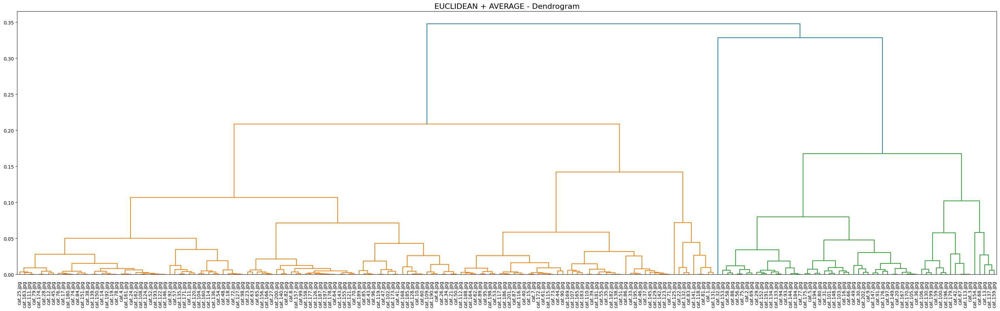


Clustering Results: Average Linkage, Euclidean Metric

Cluster 2 (53 images):


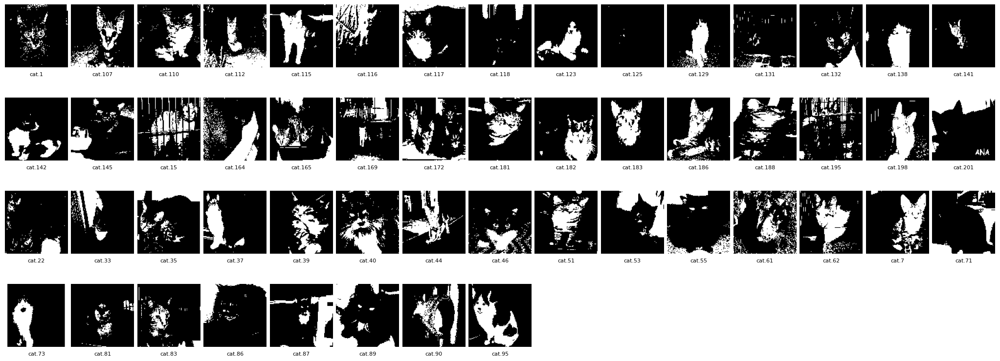


Cluster 1 (91 images):


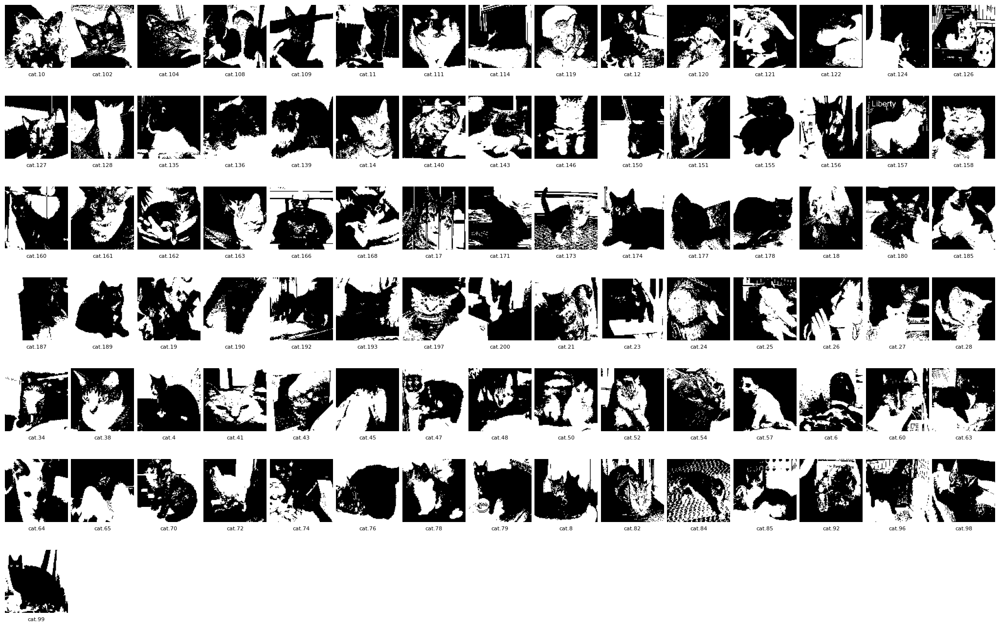


Cluster 3 (57 images):


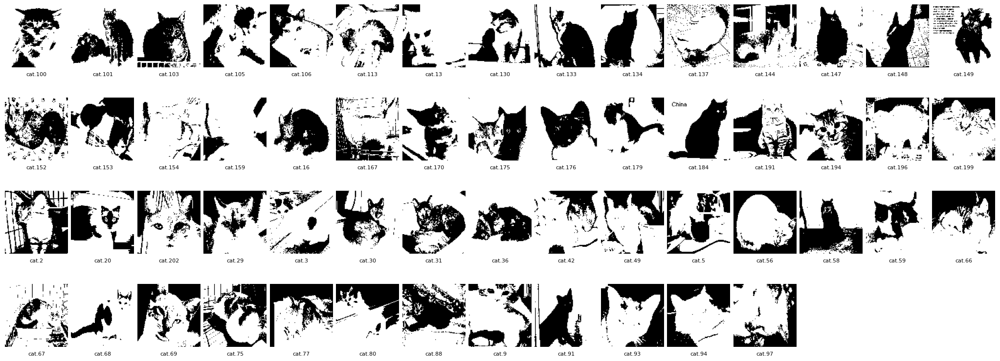


Cluster 4 (1 images):


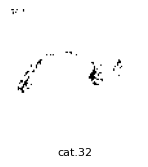


EUCLIDEAN + COMPLETE
--------------------------------------------------------------------------------


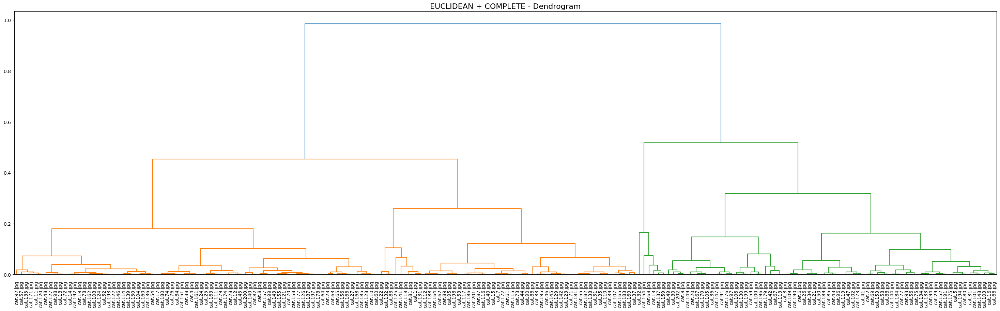


Clustering Results: Complete Linkage, Euclidean Metric

Cluster 1 (128 images):


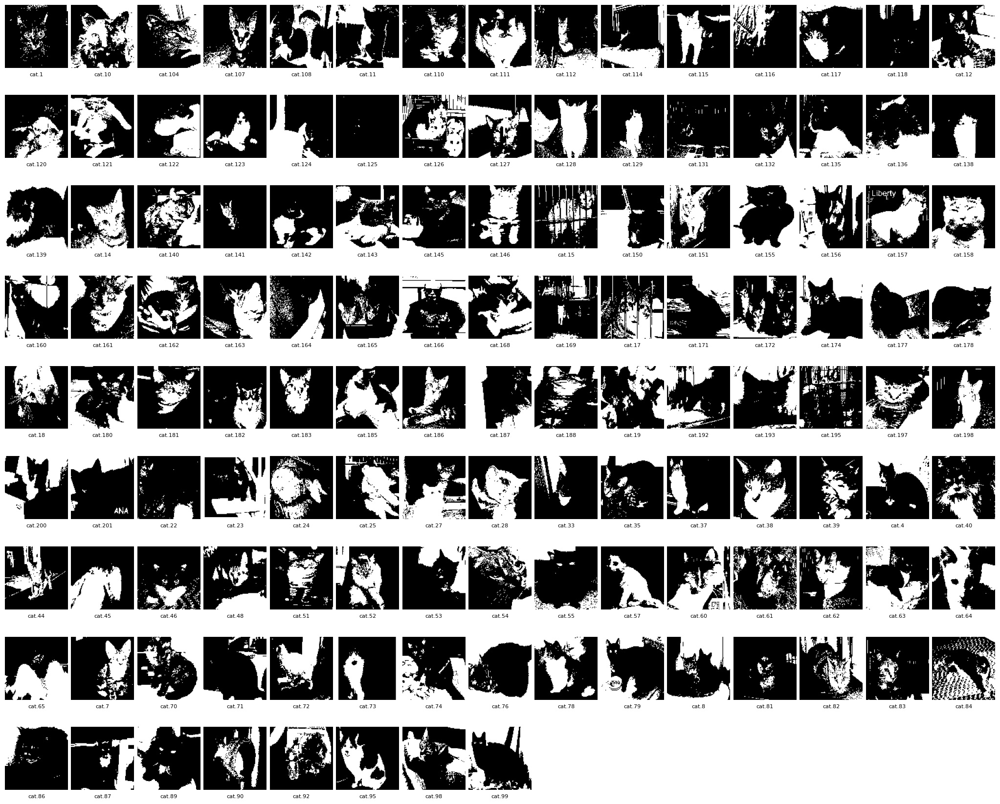


Cluster 3 (68 images):


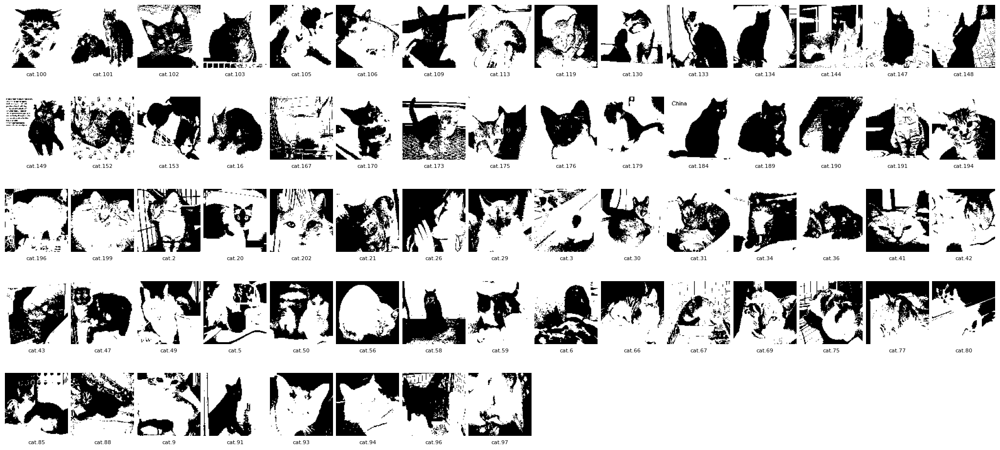


Cluster 2 (6 images):


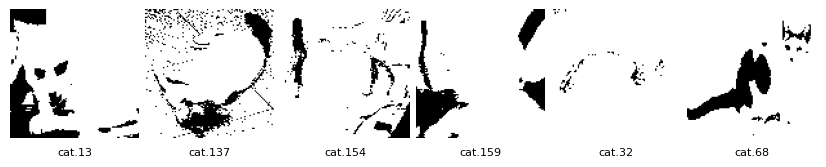


EUCLIDEAN + SINGLE
--------------------------------------------------------------------------------


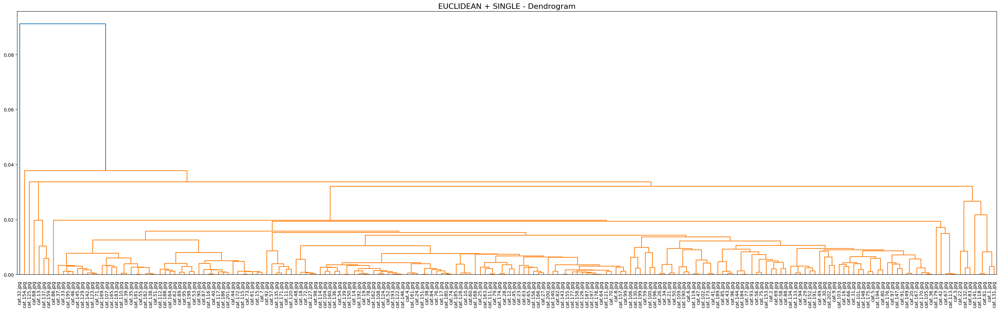


Clustering Results: Single Linkage, Euclidean Metric

Cluster 1 (201 images):


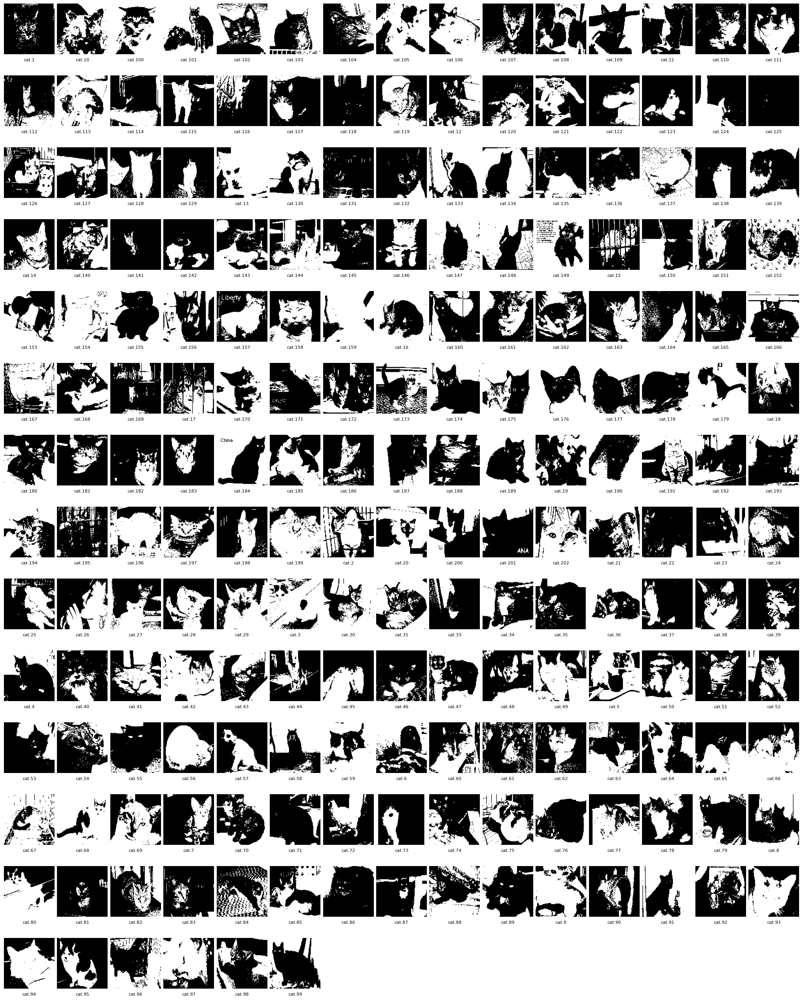


Cluster 2 (1 images):


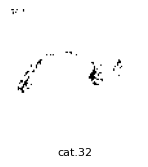


CITYBLOCK + AVERAGE
--------------------------------------------------------------------------------


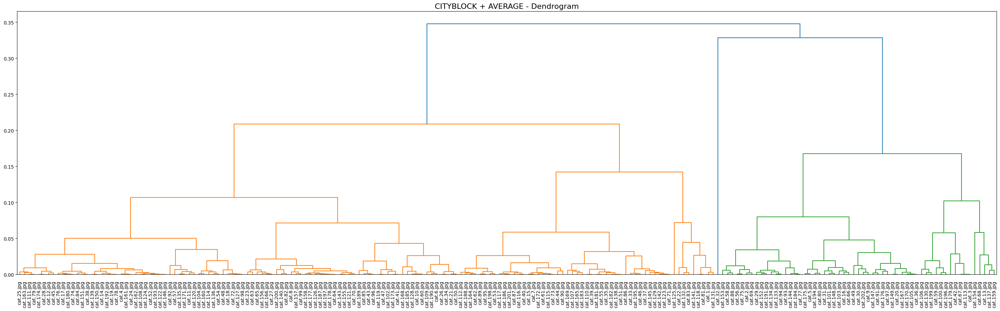


Clustering Results: Average Linkage, Cityblock Metric

Cluster 2 (53 images):


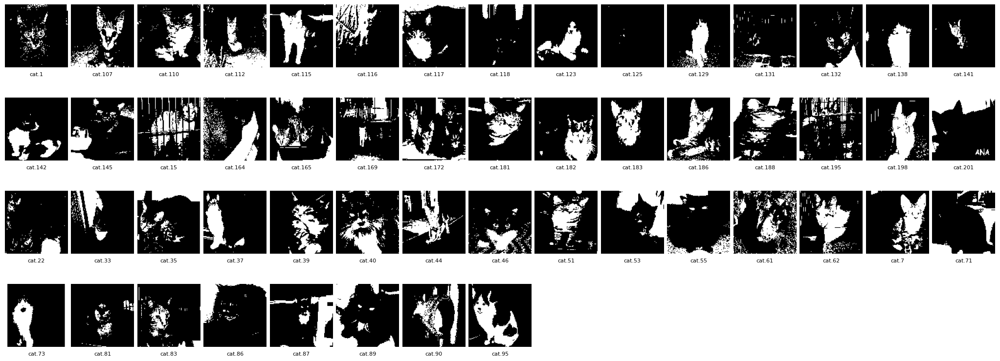


Cluster 1 (91 images):


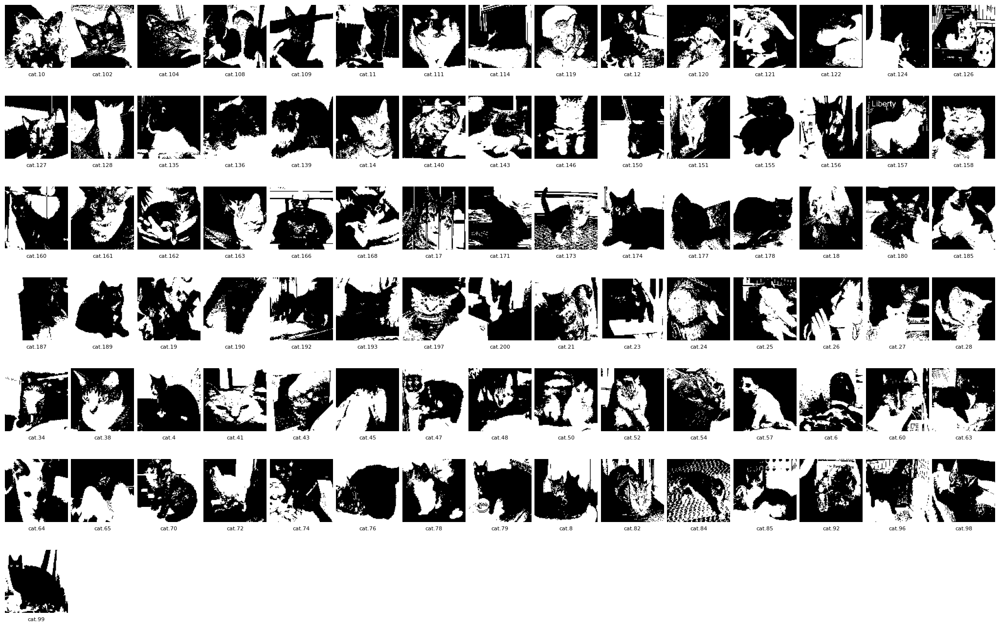


Cluster 3 (57 images):


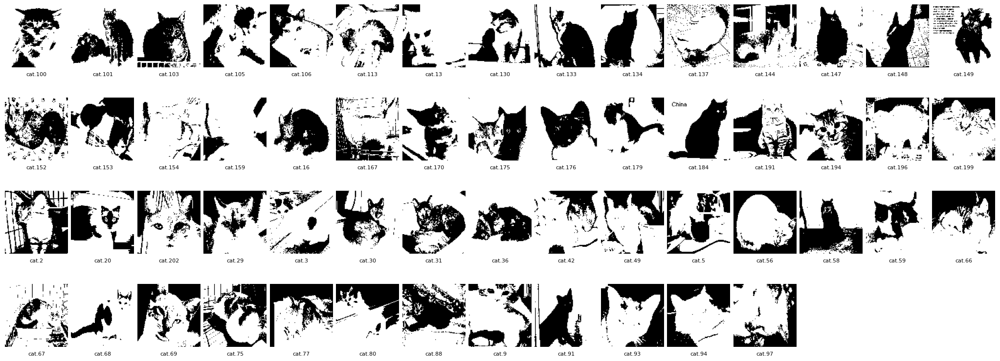


Cluster 4 (1 images):


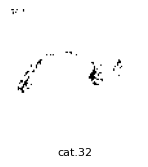


CITYBLOCK + COMPLETE
--------------------------------------------------------------------------------


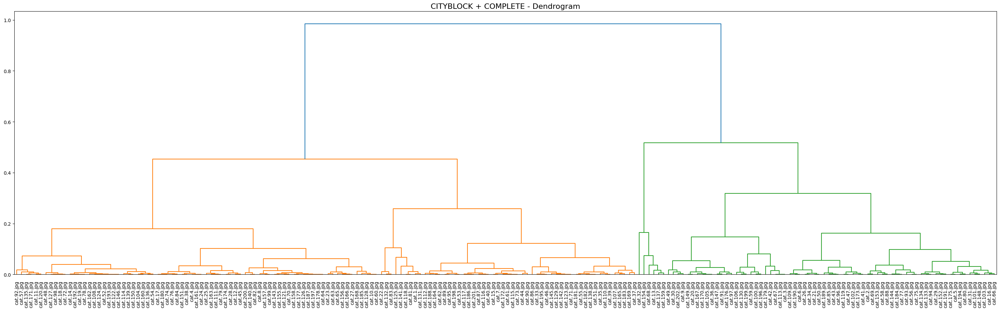


Clustering Results: Complete Linkage, Cityblock Metric

Cluster 1 (128 images):


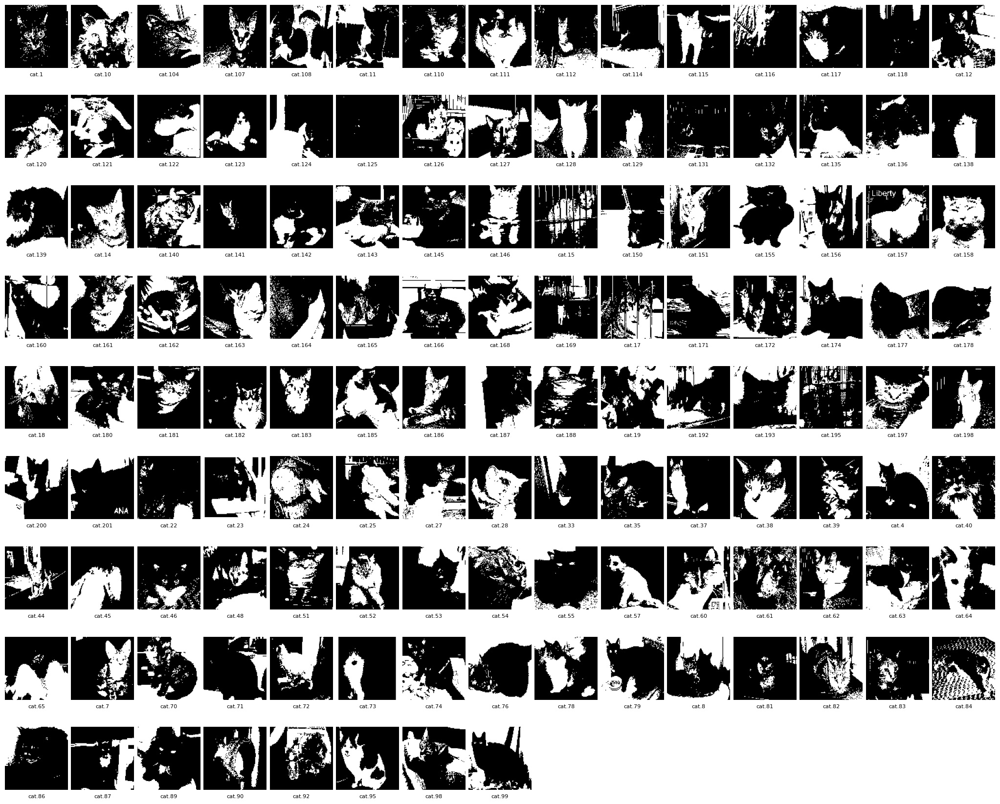


Cluster 3 (68 images):


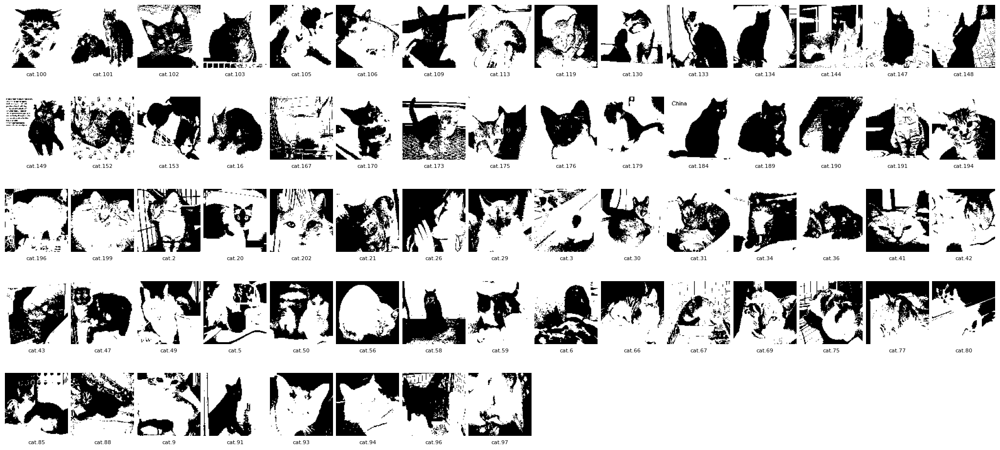


Cluster 2 (6 images):


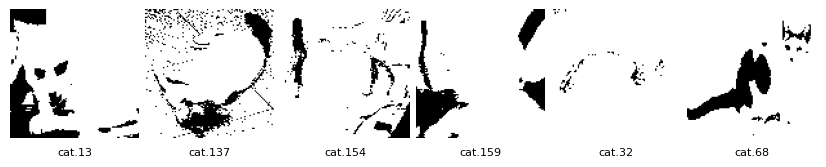


CITYBLOCK + SINGLE
--------------------------------------------------------------------------------


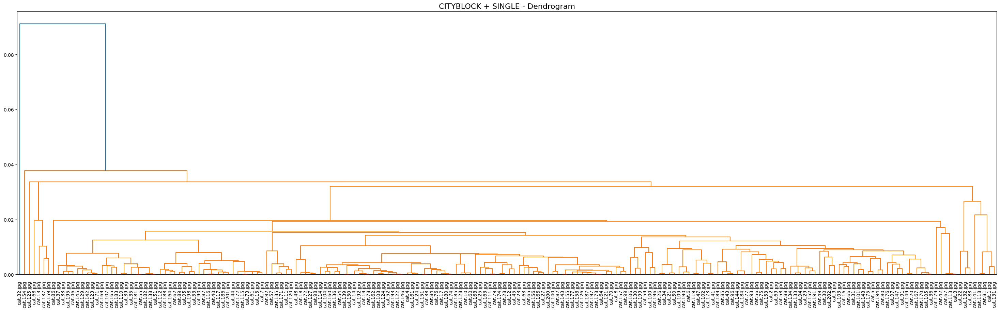


Clustering Results: Single Linkage, Cityblock Metric

Cluster 1 (201 images):


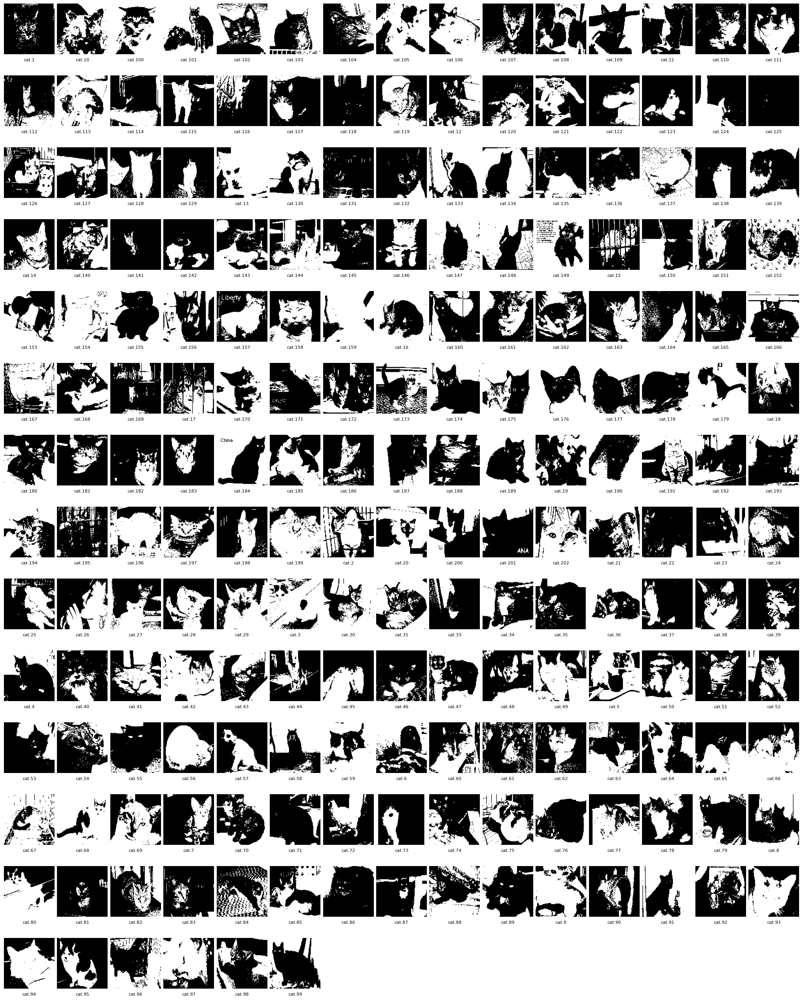


Cluster 2 (1 images):


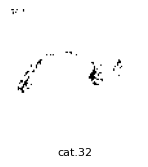


BRAYCURTIS + AVERAGE
--------------------------------------------------------------------------------


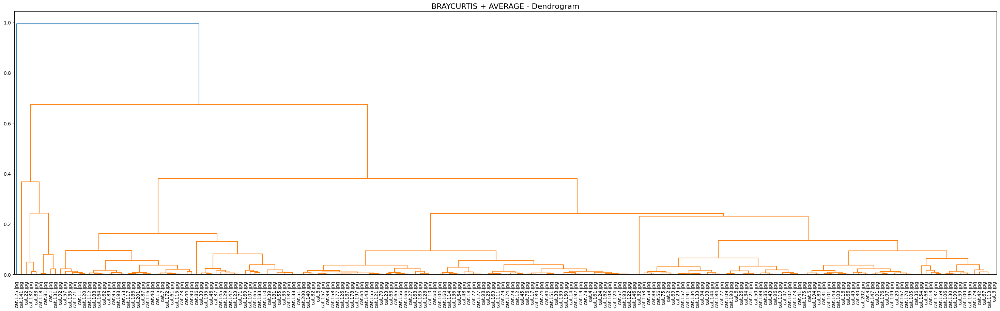


Clustering Results: Average Linkage, Braycurtis Metric

Cluster 1 (8 images):


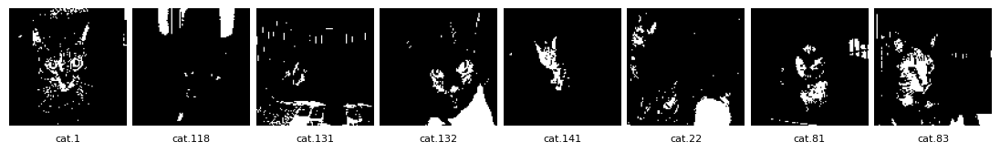


Cluster 2 (193 images):


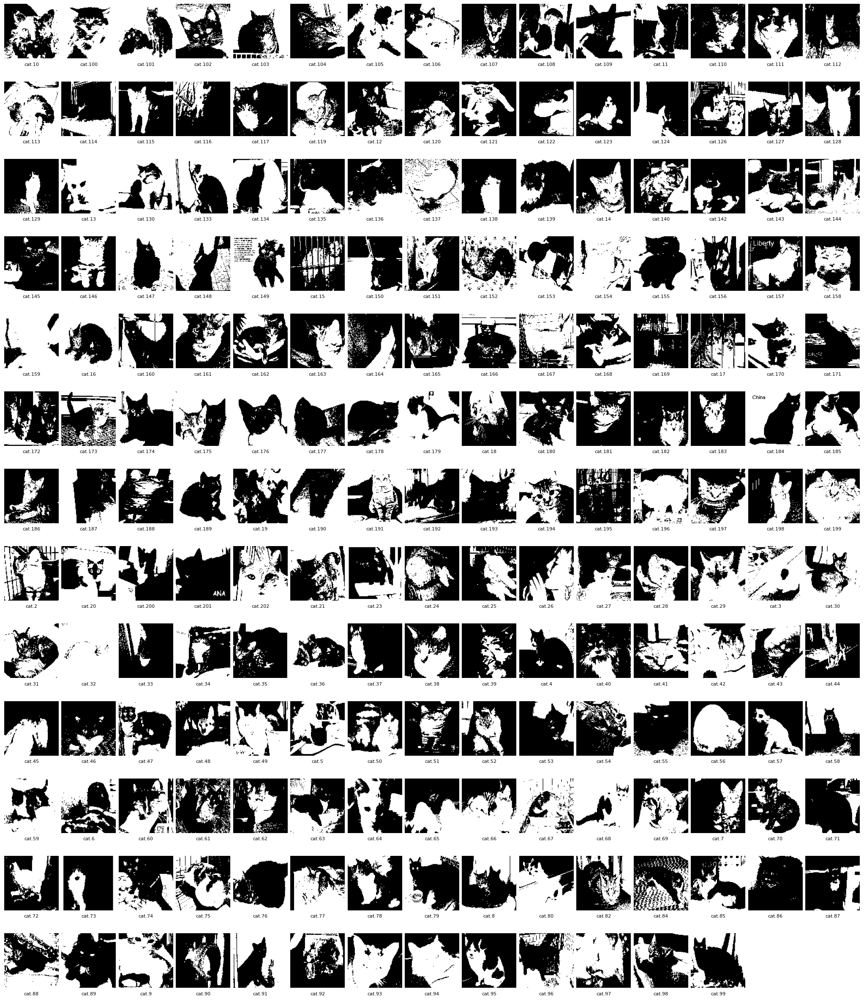


Cluster 3 (1 images):


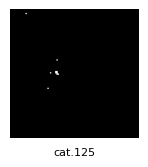


BRAYCURTIS + COMPLETE
--------------------------------------------------------------------------------


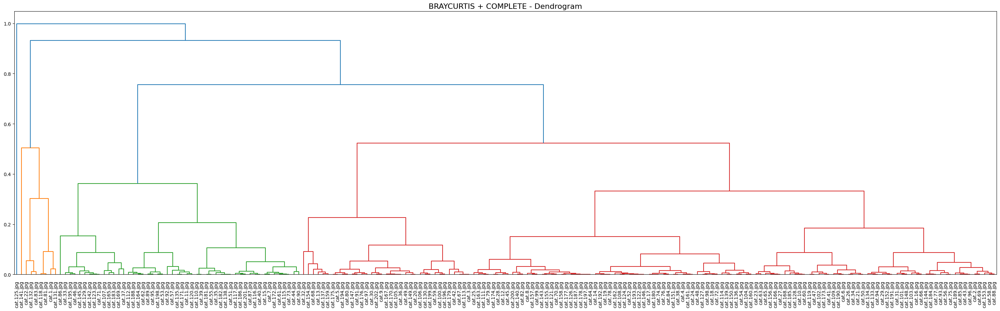


Clustering Results: Complete Linkage, Braycurtis Metric

Cluster 1 (7 images):


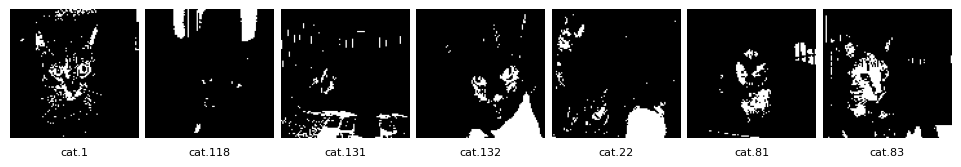


Cluster 5 (108 images):


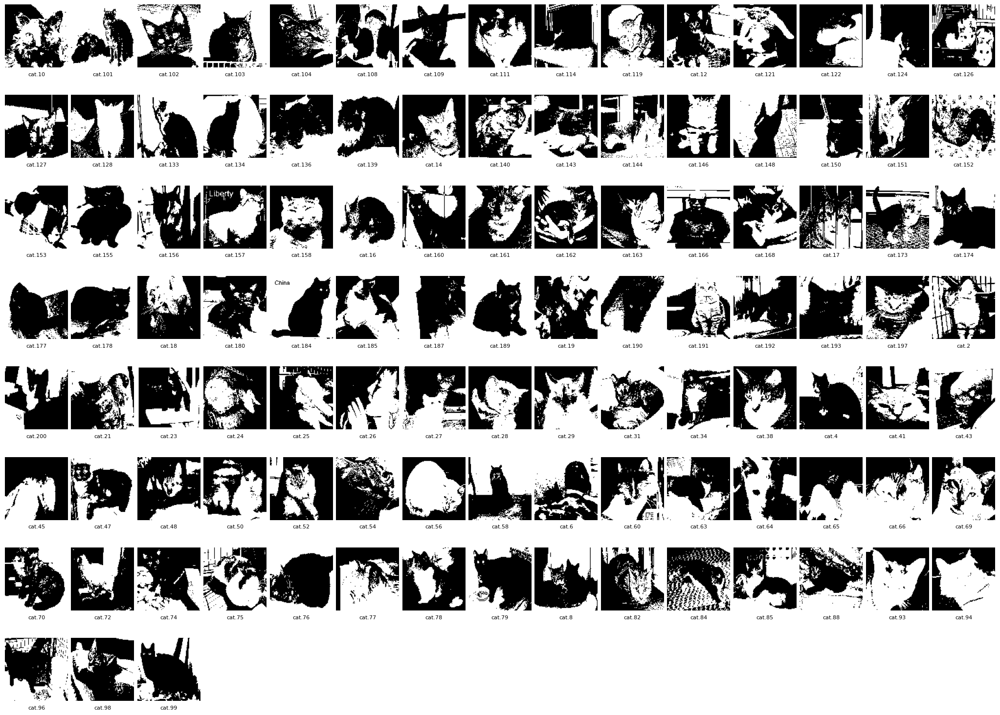


Cluster 4 (35 images):


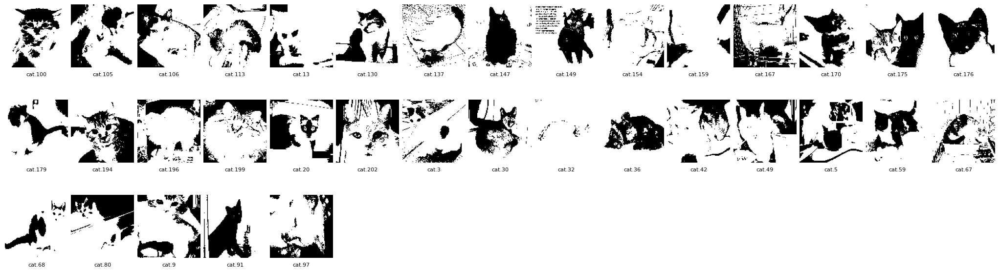


Cluster 3 (50 images):


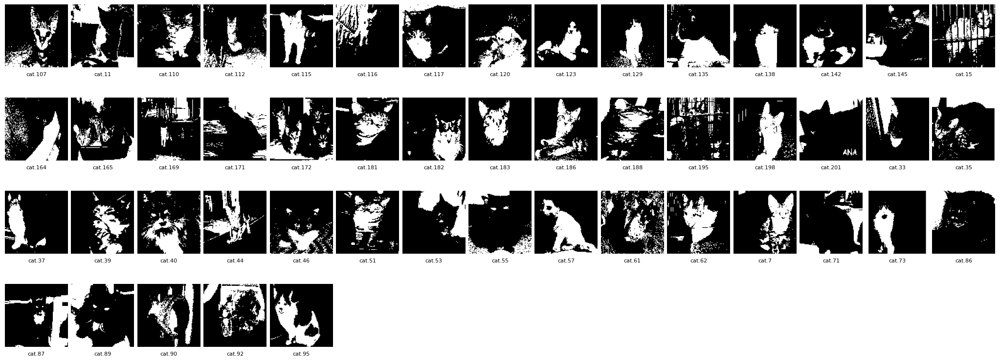


Cluster 6 (1 images):


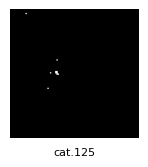


Cluster 2 (1 images):


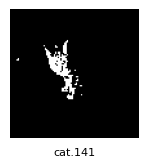


BRAYCURTIS + SINGLE
--------------------------------------------------------------------------------


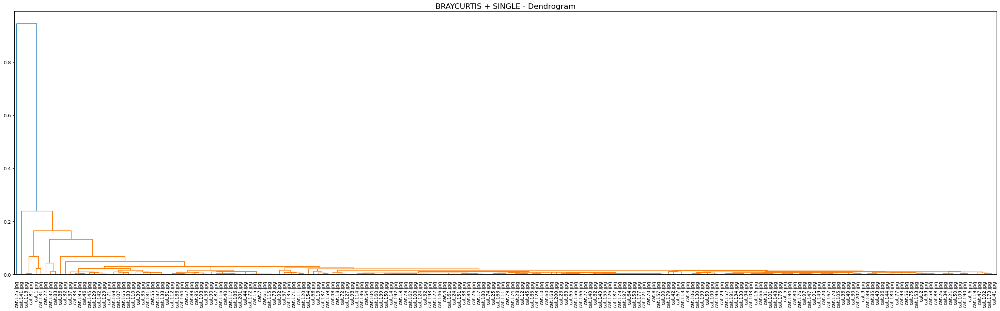


Clustering Results: Single Linkage, Braycurtis Metric

Cluster 1 (201 images):


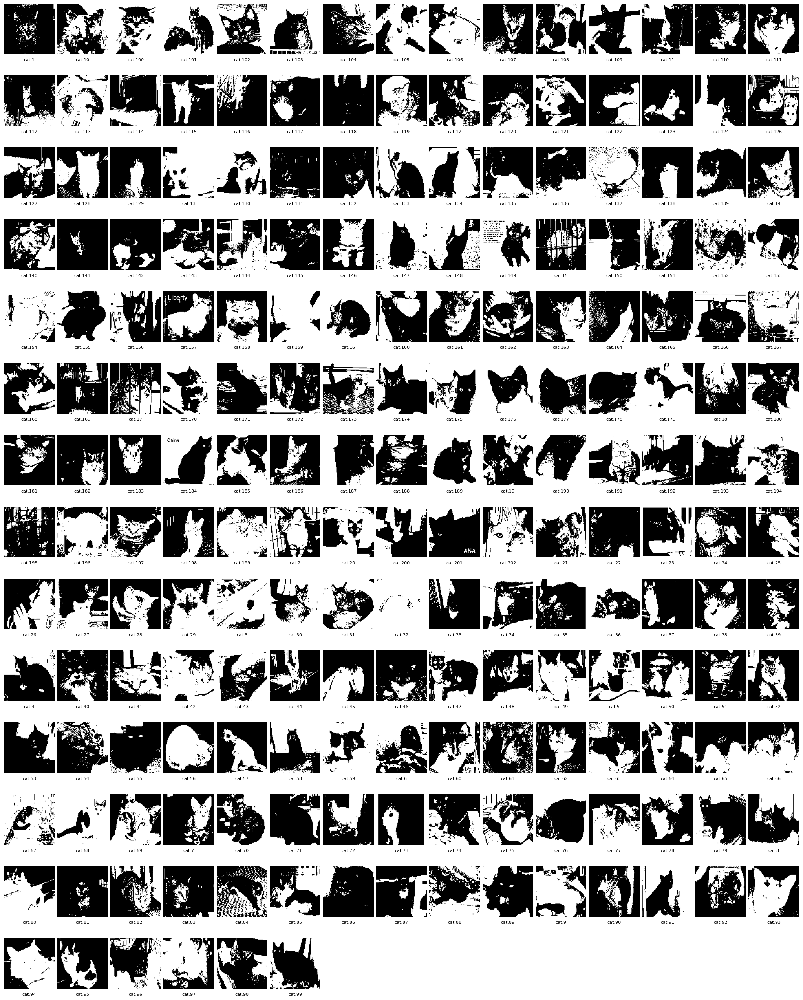


Cluster 2 (1 images):


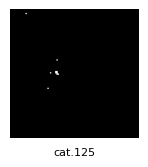

In [ ]:
import os
import cv2
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt

BASE_FOLDER = os.path.join("data", "cats")
IMAGES_PER_ROW = 15  

def load_images_from_folder(base_path):
    all_images = []
    image_paths = []
    image_names = []
    
    for fname in os.listdir(base_path):
        fpath = os.path.join(base_path, fname)
        if fname.lower().endswith(('.jpg', '.png', '.jpeg')):
            img = cv2.imread(fpath)
            if img is not None:
                all_images.append(img)
                image_paths.append(fpath)
                image_names.append(fname)
    return all_images, image_paths, image_names

def preprocess_image(img, threshold=127):
    img = cv2.resize(img, (100, 100))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
    return binary

def extract_white_percentage(binary_img):
    return np.sum(binary_img == 255) / binary_img.size

def display_clusters(binary_images, image_names, labels, method, metric):
    cluster_dict = {}
    for idx, cluster_id in enumerate(labels):
        if cluster_id not in cluster_dict:
            cluster_dict[cluster_id] = []
        cluster_dict[cluster_id].append(idx)
    
    print(f"\n{'='*60}\nClustering Results: {method.capitalize()} Linkage, {metric.capitalize()} Metric\n{'='*60}")
    for cluster_id, indices in cluster_dict.items():
        print(f"\nCluster {cluster_id} ({len(indices)} images):")
        
        cols = IMAGES_PER_ROW
        rows = int(np.ceil(len(indices) / cols))
        
        fig_width = max(15, cols * 1.5)  
        fig_height = max(6, rows * 2)    
        plt.figure(figsize=(fig_width, fig_height))
        
        grid = plt.GridSpec(rows, cols, wspace=0.05, hspace=0.3)
        
        for i, idx in enumerate(indices):
            ax = plt.subplot(grid[i // cols, i % cols])
            ax.imshow(binary_images[idx], cmap='gray')
            
            title = os.path.splitext(image_names[idx])[0]
            ax.set_title(title, fontsize=8, pad=2, y=-0.15)
            ax.axis('off')
        
        plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95)
        plt.show()

def compare_linkage_methods(binary_images, image_names):
    if len(binary_images) < 2:
        print("Error: Need at least 2 images for clustering.")
        return

    def extract_features(img):
        return [np.sum(img == 255) / img.size]

    features = np.array([extract_features(img) for img in binary_images])

    distance_metrics = ['euclidean', 'cityblock', 'braycurtis']
    linkage_methods = ['average', 'complete', 'single']

    for metric in distance_metrics:
        for method in linkage_methods:
            print(f"\n{'='*80}")
            print(f"{metric.upper()} + {method.upper()}")
            print(f"{'-'*80}")

            try:
                dist_matrix = pdist(features, metric)
                Z = linkage(dist_matrix, method)

                plt.figure(figsize=(30, 12))
                dendrogram(Z, labels=np.array(image_names), leaf_rotation=90, leaf_font_size=9)
                plt.title(f"{metric.upper()} + {method.upper()} - Dendrogram", fontsize=16)
                plt.tick_params(axis='x', labelsize=10, pad=10)
                plt.tight_layout(pad=3.0)
                plt.subplots_adjust(bottom=0.30)
                plt.show()

                threshold = 0.5 * np.max(Z[:, 2])
                labels = fcluster(Z, threshold, criterion='distance')

                display_clusters(binary_images, image_names, labels, method, metric)

            except Exception as e:
                print(f"Error with {metric}/{method}: {str(e)}")


if __name__ == "__main__":
    images, _, image_names = load_images_from_folder(BASE_FOLDER)
    
    if len(images) == 0:
        print("No images found.")
    else:
        print(f"{len(images)} images loaded.")
        binary_images = [preprocess_image(img) for img in images]
        
        compare_linkage_methods(binary_images, image_names)

### Exercise 4

### Anomaly Detection Analysis
This notebook explores anomaly detection using the `annthyroid_21feat_normalised.csv` dataset. Two methods will be implemented: one clustering-based and one non-clustering-based. The results will be compared using defined criteria.

### 1. Library Imports
Load essential Python libraries for data manipulation, plotting, PCA, clustering, and anomaly detection.

In [2]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import mutual_info_classif
from sklearn.cluster import DBSCAN
import numpy as np

### 2. Load Dataset
Read the normalized thyroid dataset and automatically detect which class label corresponds to anomalies.

In [3]:
# Load the dataset
data = pd.read_csv('annthyroid_21feat_normalised.csv')
data.head()
# Automatically detect anomaly and normal labels
anomaly_label = data['class'].value_counts().idxmin()
normal_class = data['class'].mode()[0]
print(f"Detected anomaly_label={anomaly_label}, normal_class={normal_class}")

Detected anomaly_label=1, normal_class=0


### 3. Exploratory Data Analysis (EDA)
Compute and visualize feature correlations to identify potential relationships among variables.

#### Exploratory Data Analysis (EDA)
Analyze the dataset to identify relevant dimensions for anomaly detection.

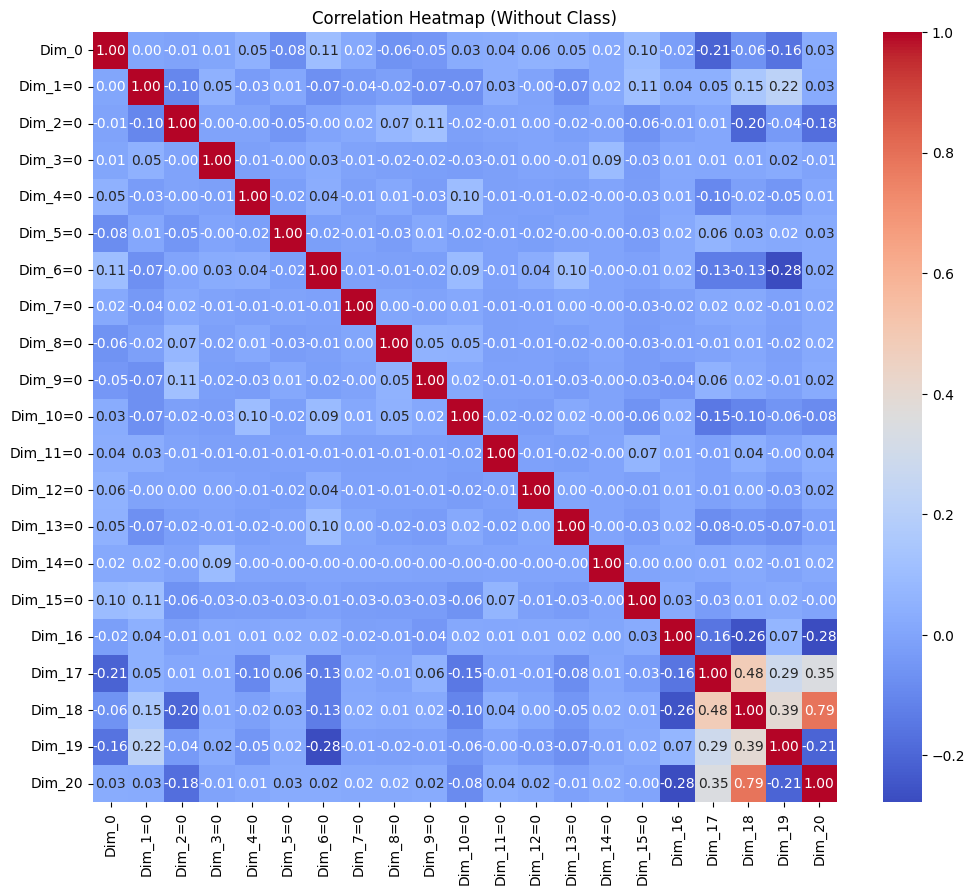

In [4]:
# Drop the 'class' column
data_no_class = data.drop(columns=['class'])

# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(data_no_class.corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap (Without Class)')
plt.show()
plt.close()

### 3.1 Pairplot of Top Correlated Features
Visualize joint distributions for the most correlated feature pairs.

In [5]:
correlation_matrix = data_no_class.corr()
high_corr_features = correlation_matrix[correlation_matrix > 0.3].stack().reset_index()
high_corr_features = high_corr_features[high_corr_features['level_0'] != high_corr_features['level_1']]
high_corr_features.columns = ['Feature1', 'Feature2', 'Correlation']
high_corr_features.sort_values(by='Correlation', ascending=False)

,Feature1,Feature2,Correlation
27,Dim_20,Dim_18,0.787510
23,Dim_18,Dim_20,0.787510
18,Dim_17,Dim_18,0.481127
20,Dim_18,Dim_17,0.481127
24,Dim_19,Dim_18,0.393994
22,Dim_18,Dim_19,0.393994
19,Dim_17,Dim_20,0.349693
26,Dim_20,Dim_17,0.349693


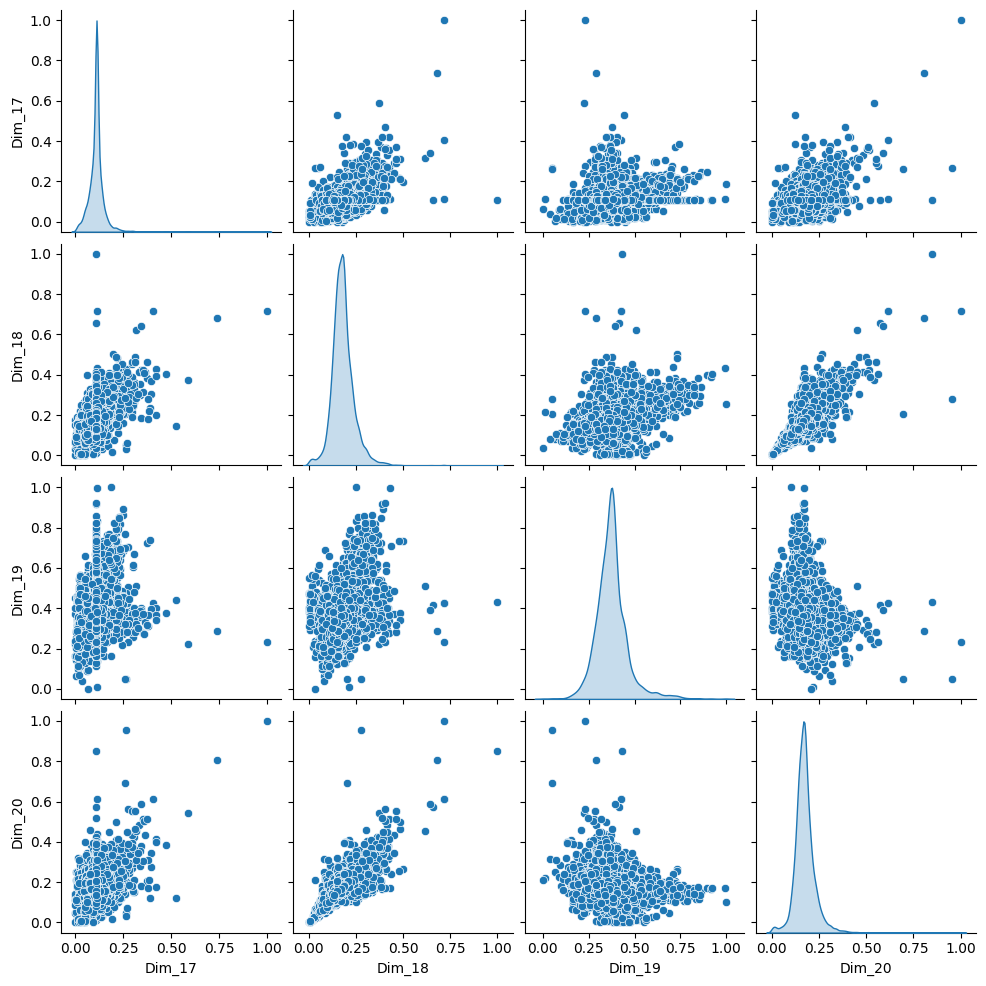

In [6]:
if not high_corr_features.empty:
    selected_features = high_corr_features['Feature1'].unique()[:5] 
    sns.pairplot(data[selected_features], diag_kind='kde')
    plt.show()  
else:
    print("No highly correlated features found. Skipping pairplot.")

### 4. Principal Component Analysis (PCA)
Reduce dimensionality to 2 components and visualize the data in PCA space.

#### Principal Component Analysis (PCA)
Perform PCA to identify the most influential dimensions for anomalies.

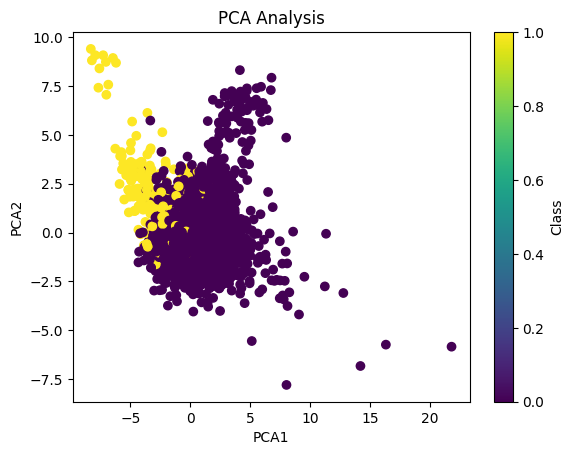

In [7]:
# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data.iloc[:, :-1])

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Add PCA results to the dataset
data['PCA1'] = pca_result[:, 0]
data['PCA2'] = pca_result[:, 1]

# Visualize PCA results
plt.scatter(data['PCA1'], data['PCA2'], c=data['class'], cmap='viridis')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('PCA Analysis')
plt.colorbar(label='Class')
plt.show()

### 5. Feature Selection
Identify the most relevant features based on mutual information and outlier counts. Plot selected features.
**mutual_info_classif** computes the mutual information between each feature and the target variable, estimating how much knowing a feature reduces uncertainty about the target. It captures both linear and non-linear dependencies and helps select the most informative features.

Feature importance based on mutual information:
Dim_16: 0.2110
Dim_17: 0.0698
Dim_20: 0.0636
Dim_18: 0.0494
Dim_2=0: 0.0116
Dim_19: 0.0076
Dim_0: 0.0062
Dim_9=0: 0.0060
Dim_6=0: 0.0036
Dim_11=0: 0.0035
Dim_5=0: 0.0033
Dim_7=0: 0.0032
Dim_12=0: 0.0016
Dim_1=0: 0.0015
Dim_14=0: 0.0011
Dim_15=0: 0.0008
Dim_4=0: 0.0002
Dim_3=0: 0.0000
Dim_8=0: 0.0000
Dim_10=0: 0.0000
Dim_13=0: 0.0000
Top features by number of outliers:
Dim_2=0: 940
Dim_17: 822
Dim_16: 760
Dim_10=0: 495
Dim_19: 495
Selected features for cross-validation: ['Dim_2=0', 'Dim_17', 'Dim_16', 'Dim_10=0', 'Dim_19']


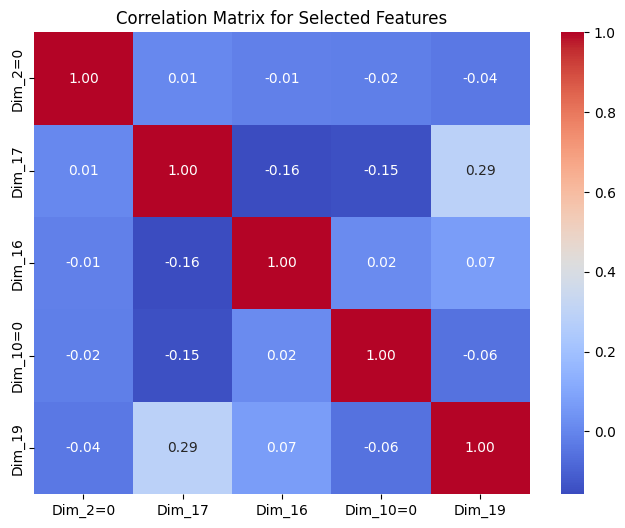

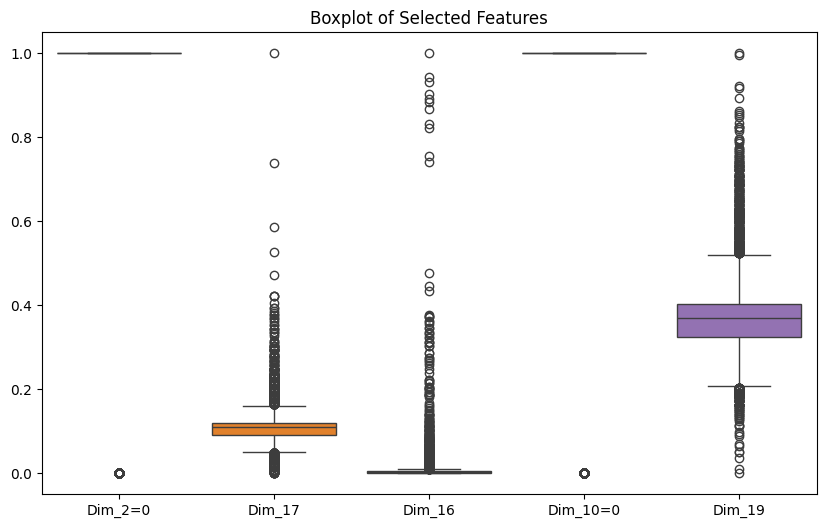

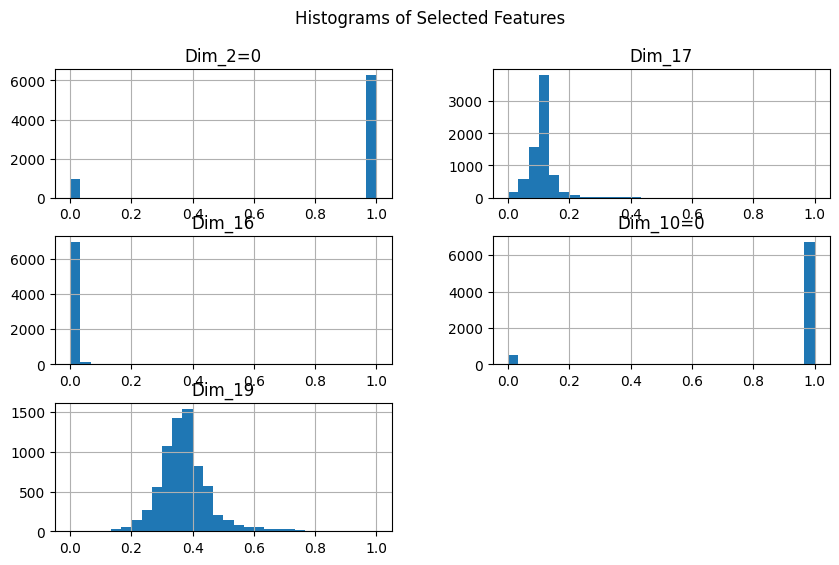

In [8]:
mutual_info = mutual_info_classif(data_no_class, data['class'])

sorted_features = sorted(zip(data_no_class.columns, mutual_info), key=lambda x: x[1], reverse=True)

# Print the sorted features
print("Feature importance based on mutual information:")
for feature, score in sorted_features:
    print(f"{feature}: {score:.4f}")

# Compute outlier counts per feature using IQR method
outlier_counts = {}
for col in data_no_class.columns:
    Q1 = data_no_class[col].quantile(0.25)
    Q3 = data_no_class[col].quantile(0.75)
    IQR = Q3 - Q1
    outlier_counts[col] = ((data_no_class[col] < Q1 - 1.5 * IQR) | (data_no_class[col] > Q3 + 1.5 * IQR)).sum()

sorted_outliers = sorted(outlier_counts.items(), key=lambda x: x[1], reverse=True)

print("Top features by number of outliers:")
for feature, count in sorted_outliers[:5]:
    print(f"{feature}: {count}")

counts = [count for _, count in sorted_outliers]
mean_count = np.mean(counts)
relevant_features = [feature for feature, count in sorted_outliers if count > mean_count]
if not relevant_features:
    relevant_features = [sorted_outliers[0][0]]
if len(relevant_features) > 5:
    relevant_features = relevant_features[:5]
selected_features = relevant_features
print("Selected features for cross-validation:", selected_features)

X_selected = data_no_class[selected_features].values

plt.figure(figsize=(8, 6))
sns.heatmap(data[selected_features].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix for Selected Features')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=data[selected_features])
plt.title('Boxplot of Selected Features')
plt.show()

data[selected_features].hist(figsize=(10, 6), bins=30)
plt.suptitle('Histograms of Selected Features')
plt.show()

### 6. kNN Parameter Tuning
Use an unsupervised 'elbow' approach: plot threshold vs k.

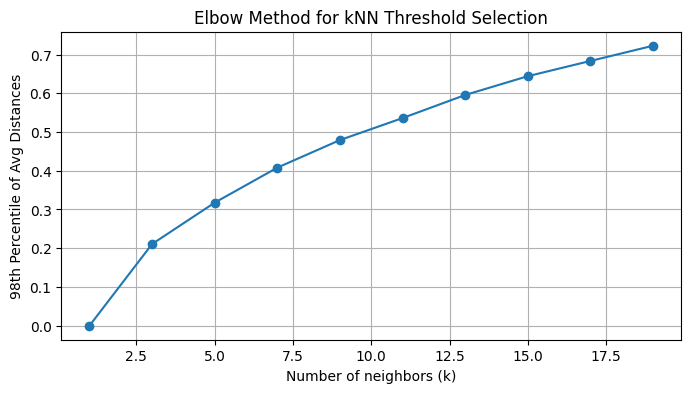

In [9]:
# Prepare PCA features for kNN evaluation
pca_features = data[['PCA1', 'PCA2']].values

k_values = list(range(1, 20, 2))
thresholds = []
for k in k_values:
    knn = NearestNeighbors(n_neighbors=k)
    knn.fit(pca_features)
    distances, _ = knn.kneighbors(pca_features)
    avg_distances = np.mean(distances, axis=1)
    # Use 98th percentile as threshold metric
    thresholds.append(np.percentile(avg_distances, 98))

# Plot the elbow curve
plt.figure(figsize=(8, 4))
plt.plot(k_values, thresholds, marker='o')
plt.xlabel('Number of neighbors (k)')
plt.ylabel('98th Percentile of Avg Distances')
plt.title('Elbow Method for kNN Threshold Selection')
plt.grid(True)
plt.show()



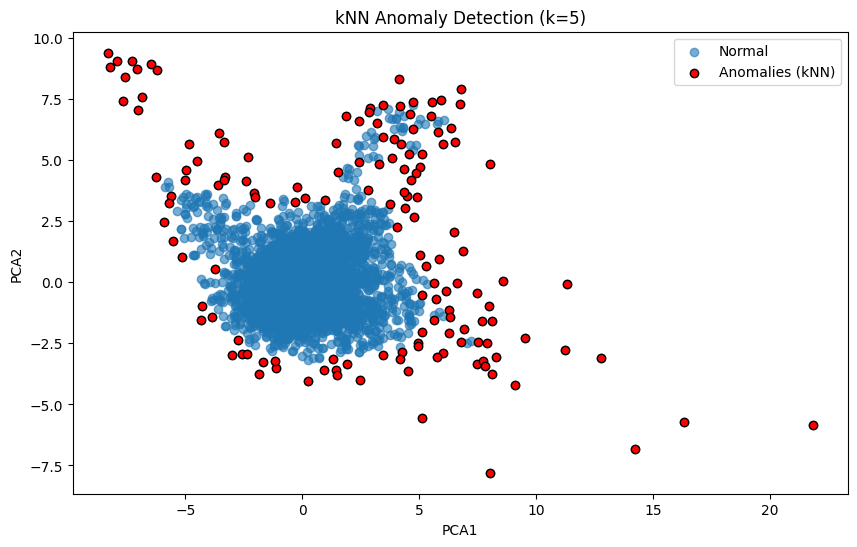

In [11]:
optimal_k = 5 # choose based on elbow plot

# Adjusted kNN Anomaly Detection using optimal_k
knn = NearestNeighbors(n_neighbors=optimal_k)
knn.fit(pca_features)
distances, _ = knn.kneighbors(pca_features)
avg_distances = np.mean(distances, axis=1)
threshold = np.percentile(avg_distances, 98)
anomalies_knn = data[avg_distances > threshold]

plt.figure(figsize=(10, 6))
plt.scatter(data['PCA1'], data['PCA2'], label='Normal', alpha=0.6)
plt.scatter(anomalies_knn['PCA1'], anomalies_knn['PCA2'], color='red', label='Anomalies (kNN)', edgecolor='k')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title(f'kNN Anomaly Detection (k={optimal_k})')
plt.legend()
plt.show()

### 7. DBSCAN-Based Anomaly Detection
Apply DBSCAN clustering to identify noise points as anomalies.Visualize the outcomes.

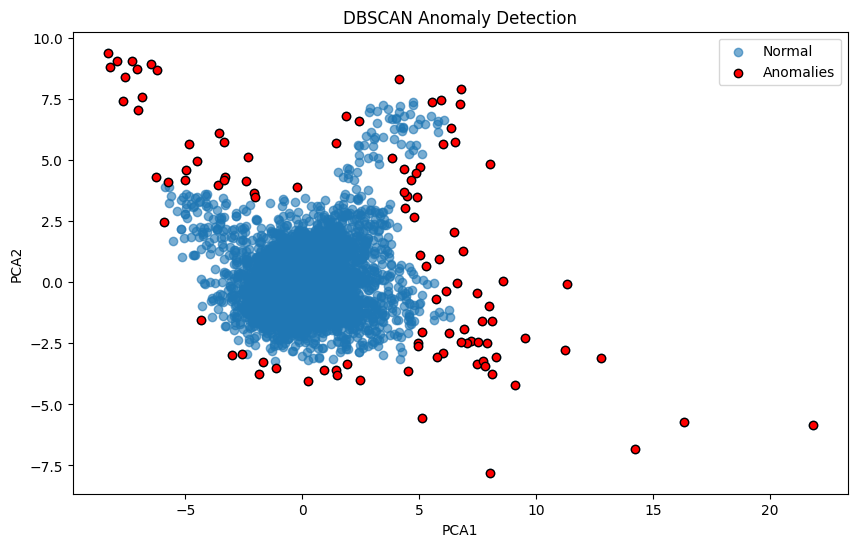

In [12]:
# Clustering-Based Anomaly Detection with DBSCAN
dbscan_features = data[['PCA1', 'PCA2']].values
dbscan = DBSCAN(eps=0.5, min_samples=5)
db_labels = dbscan.fit_predict(dbscan_features)
# Mark anomalies (label -1)
data['dbscan_anomaly'] = (db_labels == -1).astype(int)

# Evaluate DBSCAN

# Visualize DBSCAN anomalies
plt.figure(figsize=(10, 6))
plt.scatter(data['PCA1'], data['PCA2'], label='Normal', alpha=0.6)
plt.scatter(
    data.loc[data['dbscan_anomaly'] == 1, 'PCA1'],
    data.loc[data['dbscan_anomaly'] == 1, 'PCA2'],
    color='red', label='Anomalies', edgecolor='k'
)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('DBSCAN Anomaly Detection')
plt.legend()
plt.show()

### 9. Use Case

Use kNN when you need fine-grained control over anomaly thresholds and your dataset is moderate in size; use DBSCAN for density-based detection when cluster shapes are irregular and no prior labels exist.

### 10. Overall Conclusions and Comparison
In this project, we compared two anomaly detection methods on the same dataset:

- **kNN-Based Anomaly Detection**: Based on the average distance to the k nearest neighbors in PCA space (optimal k determined via cross-validation).
- **DBSCAN-Based Anomaly Detection**: Identifies noise points (label -1) in DBSCAN clustering on PCA components.


### Strengths and Weaknesses
| Method                   | Strengths                                                         | Weaknesses                                                     |
|--------------------------|-------------------------------------------------------------------|----------------------------------------------------------------|
| kNN-Based Detection      | - Direct interpretation of distances<br>- Flexible threshold via k| - Computationally expensive on large datasets<br>- Sensitive to choice of k |
| DBSCAN-Based Detection   | - Unsupervised (no labels required)<br>- Finds arbitrarily shaped clusters| - Parameters (eps, min_samples) can be hard to tune<br>- May misclassify anomalies in regions of varying density |
